# Otoczka wypukła

In [ ]:
import sys
sys.path.insert(0, '../..')

import numpy as np
np.set_printoptions(legacy='1.25')
import pandas as pd
from tests.test2 import Test
from visualizer.main import Visualizer
from functools import cmp_to_key
from random import choice, seed
inf = float('inf')

np.random.seed(1 + 13 << 3 + 17) # do uzyskania powtarzalnych wyników
seed(1 + 13 << 3 + 17)

### Przykładowe zastosowanie narzędzia do wizualizacji

In [204]:
def draw_example_1():
    vis = Visualizer()

    # point = (x, y)
    points = [
        (-62.781083483620016, 9.295526540248986),
        (-10.543100198806997, -26.080520917553812),
        (-81.64932184252287, -74.42163273030921),
        (-36.297317058417946, -72.91194239793609),
        (37.795092197502356, 57.71110085986143),
        (62.511149567563905, -29.172821102708937),
        (21.82806671019955, 2.647377124715007),
        (-46.24539555503924, 42.65521594922478),
        (-77.92302295134137, -7.666110427206263),
        (25.85862324263843, 62.49564419388622),
        (-27.71649622636616, -67.33453457840331),
        (94.83039177581244, -55.52473300629532),
        (-26.29675918891381, -51.30150933048958),
        (-70.11654929355294, 16.723865705806816),
        (26.682887992598097, -65.55763984116587),
        (57.03377667841906, -55.56635171240132),
        (-16.053624841650247, -42.333295668531456),
        (-56.810858686395505, -37.41219002465095),
        (15.604076302407279, -24.85779870929437),
        (-71.77261869976445, -12.306083264402673),
    ]
    # line_segment = ((x1, y1), (x2, y2))
    line_segments = [
        ((-81.64932184252287, -74.42163273030921), (-36.297317058417946, -72.91194239793609)),
        ((-36.297317058417946, -72.91194239793609), (26.682887992598097, -65.55763984116587)),
        ((26.682887992598097, -65.55763984116587), (94.83039177581244, -55.52473300629532)),
        ((94.83039177581244, -55.52473300629532), (37.795092197502356, 57.71110085986143)),
        ((37.795092197502356, 57.71110085986143), (25.85862324263843, 62.49564419388622)),
        ((25.85862324263843, 62.49564419388622), (-46.24539555503924, 42.65521594922478)),
        ((-46.24539555503924, 42.65521594922478), (-70.11654929355294, 16.723865705806816)),
        ((-70.11654929355294, 16.723865705806816), (-77.92302295134137, -7.666110427206263)),
        ((-77.92302295134137, -7.666110427206263), (-81.64932184252287, -74.42163273030921)),
    ]
    vis.add_point(points, color="green")
    vis.add_line_segment(line_segments, color="blue")
    vis.show()

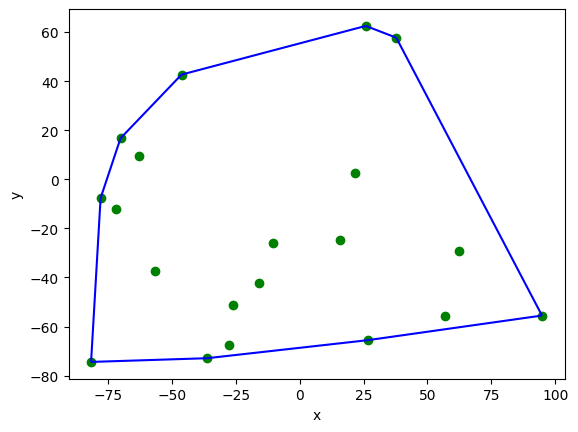

In [205]:
draw_example_1()

### Wprowadzenie

Czym jest otoczka wypukła?  
Podzbiór płaszczyzny $Q$ nazywamy wypukłym iff, gdy dla dowolnej pary punktów $p, q \in Q$ odcinek $\overline{pq}$ jest całkowicie zawarty w $Q$.  
Otoczka wypukła $\mathcal{CH}(Q)$ zbioru $Q$ jest najmniejszym wypukłym zbiorem zawierającym $Q$.

### Zastosowania otoczku wypukłej

Otoczki wypukłe - w szczególności otoczki wypukłe w przestrzeni trójwymiarowej - są spotykane w różnych zastosowaniach. Na przykład używa się ich do przyspieszania wykrywania kolizji w animacji komputerowej. Przepuśćmy, że chcemy sprawdzić, czy dwa obiekty $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się. Jeśli przez większość czasu odpowiedź na to pytanie jest negatywna, to opłaca się następująca strategia. Przybliżamy obiekty przez prostrze obiekty $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$, które zawierały orginały. Jeśli chcemy sprwadzić, czy $\mathcal{P_1}$ i $\mathcal{P_2}$ przecinają się, najpierw sprawdzamy, czy przecinają się $\widehat{\mathcal{P_1}}$ i $\widehat{\mathcal{P_2}}$. Jeśli występuje ten przypadek, to powinniśmy wykonać test na orginalnych obiektach, który jest przepuszczalnie znacznie kosztowniejszy.  
Sprawdzanie przecięcia otoczek wypukłych jest bardziej skomplikowane niż dla sfer - choć mimo to łatwiejsze niż dla obiektów niewypukłych - ale otoczki wypukłe mogą dużo lepiej przybliżać większość obiektów.

## Generowanie losowych punktów na płaszczyźnie 

Zapoznaliśmy się i wiemy jak generowac losowe punkty na płaszczyźnie z laboratorium I (współrzędne rzeczywiste typu *double* - podwójna precyzja obliczeń). Przygotuj zestawy punktów, które będzie można użyć jako testowe dla algorytmów obliczania otoczki wypukłej.

Uzupełnij funkcję ```generate_uniform_points```.

In [20]:
def generate_uniform_points(left=-100, right=100, n=100):
    """
    Funkcja generuje równomiernie n punktów na kwadwratowym
    obszarze od left do right (jednakowo na osi y)
    o współrzędnych rzeczywistych
    :param left: lewy kraniec przedziału
    :param right: prawy kraniec przedziału
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
             np. [(x1, y1), (x2, y2), ... (xn, yn)]
    """
    points = np.random.uniform(left, right, size = (n, 2))
    points_list = [tuple(point) for point in points]
    
    return points_list

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D o współrzędnych z przedziału $x \in \langle -100,100 \rangle$ oraz $y \in \langle -100,100\rangle$.

In [207]:
points_a = generate_uniform_points(-100, 100, 100)

Zwizualizuj wygenerowane punkty.

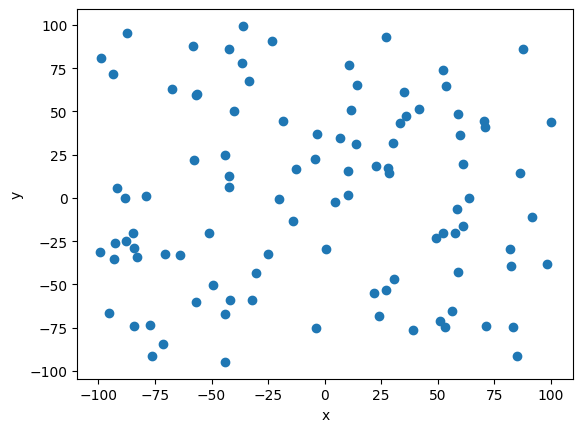

In [208]:
# visualize(points_a)
vis = Visualizer()
vis.add_point(points_a)
vis.show()

Uzupełnij funkcję ```generate_circle_points```.

In [21]:
def generate_circle_points(O, R, n=100):
    """
    Funkcja generuje jednostajnie n punktów na okręgu o środku O i promieniu R
    :param O: krotka współrzędnych x, y określająca środek okręgu
    :param R: promień okręgu
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    """
    t_factor = np.random.uniform(0, 1, size = n)
    points = []

    for t in t_factor:
        x = O[0] + R * np.cos((2 * np.pi) * t)
        y = O[1] + R * np.sin((2 * np.pi) * t)
        points.append((x, y))

    return points

<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na okręgu o środku $O = (0,0)$ i promieniu $R = 10$.

In [210]:
points_b = generate_circle_points((0, 0), 10, 100)

Zwizualizuj wygenerowane punkty.

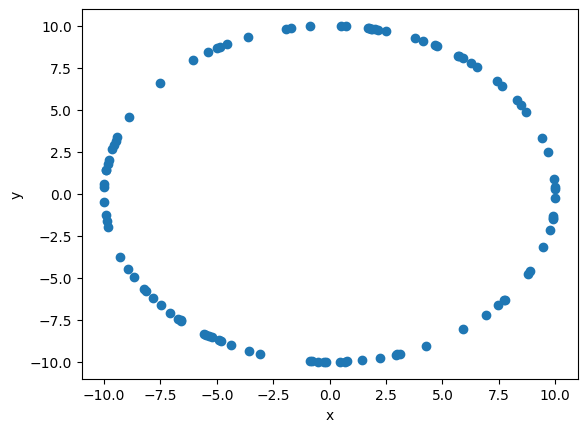

In [211]:
# visualize(points_b)
vis.clear()
vis.add_point(points_b)
vis.show()

Jak można było zauważyć, to funkcje ```generate_uniform_points``` oraz ```generate_circle_points``` są takie same jak w laboratorium I.

Uzupełnij funkcję ```generate_rectangle_points```.

In [22]:
def generate_rectangle_points(a=(-10, -10), b=(10, -10), c=(10, 10), d=(-10, 10), n=100):
    '''
    Funkcja generuje n punktów na obwodzie prostokąta
    o wierzchołkach w punktach a, b, c i d
    :param a: lewy-dolny wierzchołek prostokąta
    :param b: prawy-dolny wierzchołek prostokąta
    :param c: prawy-górny wierzchołek prostokąta
    :param d: lewy-górny wierzchołek prostokąta
    :param n: ilość generowanych punktów
    :return: tablica punktów w postaci krotek współrzędnych
    korzystam z generowania punktów na prostej (będę losowo wybierał prostą, na której wygenerowany zostanie punkt)
    '''
    """
    równanie parametryczne prostej postaci:
    x = x0 + at
    y = y0 + bt
    korzystamy z oryginalnego wektora, niedokładność wystąpić może przy granicach przedziału
    """

    # (a, b)
    vect1 = (b[0] - a[0], b[1] - a[1])
    t1_start = 0
    t1_end = (b[0] - a[0]) / vect1[0]

    # (b, c)
    vect2 = (c[0] - b[0], c[1] - b[1])
    t2_start = 0
    t2_end = (c[1] - b[1]) / vect2[1]

    # (d, c)
    vect3 = (c[0] - d[0], c[1] - d[1])
    t3_start = 0
    t3_end = (c[0] - d[0]) / vect1[0]

    # (a, d)
    vect4 = (d[0] - a[0], d[1] - a[1])
    t4_start = 0
    t4_end = (d[1] - a[1]) / vect2[1]


    linears = [(a, vect1, t1_start, t1_end), (b, vect2, t2_start, t2_end), (d, vect3, t3_start, t3_end), (a, vect4, t4_start, t4_end)]
    points = []

    for _ in range(n):
        point, vect, t_start, t_end = choice(linears)
        t = np.random.uniform(t_start, t_end)
        x = point[0] + vect[0] * t
        y = point[1] + vect[1] * t
        points.append((x, y))

    
    return points


<span style="color:red">Ćw.</span> Wygeneruj $100$ losowych punktów w przestrzeni 2D leżących na obwodzie prostokąta, którego wyznaczają wierzchołki
$(-10,-10), (10,-10), (10,10)$ oraz $(-10,10)$.

In [213]:
points_c = generate_rectangle_points(
    (-10, -10), (10, -10), (10, 10), (-10, 10), 100)

Zwizualizuj wygenerowane punkty.

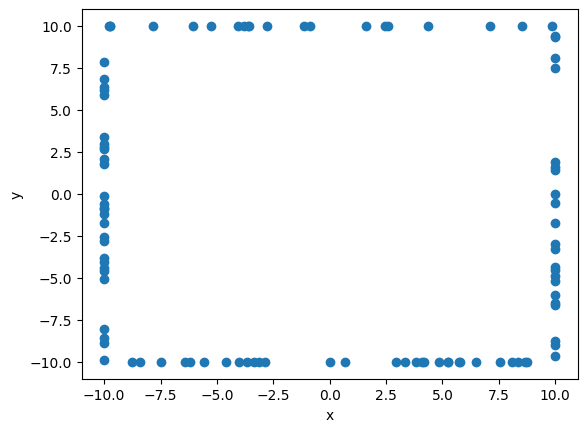

In [214]:
# visualize(points_c)
vis.clear()
vis.add_point(points_c)
vis.show()

Uzupełnij funkcję ```generate_square_points```.

In [2]:
def generate_square_points(a=(0, 0), b=(10, 0), c=(10, 10), d=(0, 10),
                           axis_n=25, diag_n=20):
    '''
    Funkcja generuje axis_n punktów na dwóch bokach kwadratu
    leżących na osiach x i y oraz diag_n punktów na
    przektąnych kwadratu, którego wyznaczają punkty
    a, b, c i d.
    :param a: lewy-dolny wierzchołek kwadratu
    :param b: prawy-dolny wierzchołek kwadratu
    :param c: prawy-górny wierzchołek kwadratu
    :param d: lewy-górny wierzchołek kwadratu
    :param axis_n: ilość generowanych punktów na każdym
                   z dwóch boków kwadratu równoległych do osi x i y
    :param diag_n: ilość generowanych punktów na każdej
                   przekątnej kwadratu
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    points = [a, b, c, d]

    # (a, b)
    vect1 = (b[0] - a[0], b[1] - a[1])
    t1_start = 0
    t1_end = (b[0] - a[0]) / vect1[0]

    # (a, d)
    vect2 = (d[0] - a[0], d[1] - a[1])
    t2_start = 0
    t2_end = (d[1] - a[1]) / vect2[1]

    # (a, c)
    vect3 = (c[0] - a[0], c[1] - a[1])
    t3_start = 0
    t3_end = (c[0] - a[0]) / vect3[0]

    # (d, b)
    vect4 = (b[0] - d[0], b[1] - d[1])
    t4_start = 0
    t4_end = (b[0] - d[0]) / vect4[0]

    axis = [(a, vect1, t1_start, t1_end), (a, vect2, t2_start, t2_end)]
    diagonals = [(a, vect3, t3_start, t3_end), (d, vect4, t4_start, t4_end)]

    for point, vect, t_start, t_end in axis:
        for _ in range(axis_n):
            t = np.random.uniform(t_start, t_end)
            x = point[0] + vect[0] * t
            y = point[1] + vect[1] * t
            points.append((x, y))

    for point, vect, t_start, t_end in diagonals:
        for _ in range(diag_n):
            t = np.random.uniform(t_start, t_end)
            x = point[0] + vect[0] * t
            y = point[1] + vect[1] * t
            points.append((x, y))

    
    return points

<span style="color:red">Ćw.</span> Wygeneruj losowe punkty w przestrzeni 2D w następujący sposób: po 25 punktów na dwóch bokach kwadratu leżących na osiach i po 20 punktów na przekątnych kwadratu, zawierający punkty wyznaczające kwadrat $(0, 0), (10, 0), (10, 10)$ oraz $(0, 10)$.

In [3]:
points_d = generate_square_points(
    (0, 0), (10, 0), (10, 10), (0, 10), 25, 20)

Zwizualizuj wygenerowane punkty.

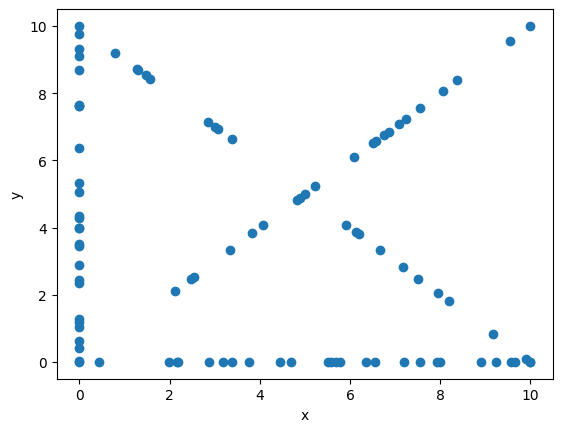

In [ ]:
# visualize(points_d)
vis.clear()
vis.add_point(points_d)
vis.show()

## Algorytm Grahama oraz algorytm Jarvisa

Po przygotowaniu przykładowych zbiorów danych i ich zwizualizowaniu, chcemy zobaczyć jak buduje się dla nich otoczka wypukła z wykorzystaniem różnych algortymów.  
W tych dwóch algorytmach potrzebna będzie funkcja którą już dobrze znamy, czyli funkcja, która sprawdza po której stornie prostej znajduje się punkt.  
Dla każdego algorytmu trzeba będzie zaimplementować dwie funkcje obliczające otoczkę wypukłę, ze względu, że jedna z nich będzie miała możliwość wyświetlania kroków postępowania w algorytmie. Druga funkcja będzie uzyteczna do porównywania czasów dla różnych zbiorów danych i względęm algorytmów.  
W graficznej funkcji danego algorytmu, jednym kolorem powinny być zaznaczone wszystkie punkty zbioru wyjściowego, drugim kolorem boki aktualne rozpatrywane, a trzecim boki wielokąta otoczki. Po zakończeniu wyznaczania otoczki, wierzchołki otoczki powinny być wyróżnione (osobnym kolorem bądź kształtem).  

### Algorytm Grahama

Algorytm Grahama tworzy otoczkę wypukłą poprzez utrzymywanie stosu $S$, w którym znajdują się punkty, które mogą, ale nie muszą tworzyć otoczki wypukłej. Za każdym razem jest wstawiany na stos (push) jeden punkt z zbioru punktów $Q$ i jest on usuwany ze stosu (pop), jeżeli nie jest punktem $\mathcal{CH}(Q)$. Kiedy algorytm kończy się, stos $S$ zawiera tylko punkty otoczki wypukłej $\mathcal{CH}(Q)$ w kierunku przeciwnym do ruchu wskazówek zegera.

---

Procedura $\mathtt{Graham-Build(Q)}$ przyjmuje zbiór punktów $Q$, gdzie $|Q| \geq 3$. Wywołuje ona funkcję $\mathtt{TOP(S)}$, która zwraca punkt z góry stosu bez zmieniania $S$ oraz
$\mathtt{NEXT-TO-TOP(S)}$, która zwraca punkt ponieżej góry stosu $S$, bez zmieniania stosu. Funkcja $\mathtt{PUSH(p, S)}$ wstawia punkt $p$ na stos $S$. Funkcja $\mathtt{POP(p, S)}$ usuwa punkt $p$ ze stosu $S$.

$\mathtt{Graham-Build(Q)}$  
1)  niech $p_0$ będzie punktem w zbiorze Q z najmniejszą współrzędną $y$,  
    oraz najmniejszą współrzędną $x$ w przypadku, gdy wiele punktów ma tą samą współrzędną $y$  
    
2)  nich $\mathtt{\langle p_1, p_2, \dots, p_m \rangle}$ będzie pozostałym zbiorem punktów w $Q$ posortowanym  
    zgodnie z przeciwnym ruchem wskazówek zegara wokół punktu $p_0$  
    (jeżeli więcej niż jeden punkt ma ten sam kąt to usuwamy wszystkie punkty  
     z wyjątkiem tego najbardziej oddalonego od $p_0$)  
3) stwórz pusty stos $S$  
4) $\mathtt{PUSH(p_0, S)}$
5) $\mathtt{PUSH(p_1, S)}$
6) $\mathtt{PUSH(p_2, S)}$
7) **for** $i = 3$ **to** m  
8) &emsp;**while** kąt utworzony przez $\mathtt{NEXT-TO-TOP(S)}$, $\mathtt{TOP(S)}$ oraz $p_i$ tworzy lewostronny skręt
9) &emsp;&emsp;$\mathtt{POP(S)}$
10) &emsp;$\mathtt{PUSH(p_i, S)}$
11) **return** $S$


---

Lewostronny skręt oznacza, że dla trzech kolejnych punktów $a, b, c$, punkt $b$ leży po lewej stronie prostej $ac$.  
  

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama.

In [4]:
def orient(a, b, c):
    return (b[0] - a[0]) * (c[1] - b[1]) - (b[1] - a[1]) * (c[0] - b[0])

def partial_dist(a, b):
    return (b[0] - a[0]) ** 2 + (b[1] - a[1]) ** 2

def find_p0_with_min_y(Q, n):
    p0_y = inf
    p0_x = inf
    p0_i = 0

    for i in range(n):
        x, y = Q[i]
        if y < p0_y or (y == p0_y and x < p0_x):
            p0_y = y
            p0_x = x
            p0_i = i

    return p0_i

In [5]:
def cmp(a, b, c, eps): # zamiast usuwać elementy współliniowe będę sortował je wg. odległości od a
    res1 = -orient(a, b, c)
    if abs(res1) <= eps:
        return partial_dist(a, b) - partial_dist(a, c)
    
    return res1

In [6]:
def graham_algorithm(Q: list, eps = 1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    n = len(Q)
    
    p0_i = find_p0_with_min_y(Q, n)

    p0 = Q[p0_i]
    Q[0], Q[p0_i] = Q[p0_i], Q[0]

    A = [p0]

    A += sorted(Q[1:], key = cmp_to_key(lambda p1, p2: cmp(p0, p1, p2, eps)))

    Q[0], Q[p0_i] = Q[p0_i], Q[0] # cofnięcie zmiany

    if n < 3: return A

    S = [p0, A[1]] # stos, na którym znajdują się punkty otoczki

    for i in range(2, n):
        while len(S) > 1 and orient(S[-2], S[-1], A[i]) <= eps:
            S.pop()  # usunięcie ostatniego punktu, jeśli jest na prawo lub współliniowy
        S.append(A[i])

    return S

Przetestuj swoją implementacje algorytmu Grahama, by sprawdzić czy poprawnie obliczana jest otoczka.

In [7]:
Test().runtest(1, graham_algorithm)

Lab 2, task 1:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 2.716s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```graham_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Grahama z dodatkową opcją wyświetlania kroków algorytmu.

In [ ]:
def graham_algorithm_draw(Q, eps = 1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Grahama oraz
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci (tablica punktów w postaci krotek współrzędnych, wizualizer pokazujący kroki algorytmu) 
    '''
    n = len(Q)
    
    edges = []
    vis = Visualizer()
    vis.add_point(Q)

    p0_i = find_p0_with_min_y(Q, n)

    p0 = Q[p0_i]
    Q[0], Q[p0_i] = Q[p0_i], Q[0]

    A = [p0]

    A += sorted(Q[1:], key = cmp_to_key(lambda p1, p2: cmp(p0, p1, p2, eps)))

    Q[0], Q[p0_i] = Q[p0_i], Q[0] # cofnięcie zmiany w tablicy

    if n < 3:
        for i in range(n - 1):
            vis.add_point(A[i], color = "res")
            vis.add_line_segment([A[i], A[i + 1]], color="red")
        vis.add_point(A[n - 1], color = "res")
        return A, vis

    S = [p0, A[1]]

    vis.add_point(p0, color="red")
    vis.add_point(A[1], color="red")

    ls = vis.add_line_segment([p0, A[1]], color="red")
    edges.append(ls)

    for i in range(2, n):
        while len(S) > 1 and orient(S[-2], S[-1], A[i]) <= eps:
            vis.remove_figure(edges[-1])
            vis.add_point(S[-1],color="brown")
            S.pop()  # Usuń ostatni punkt, jeśli jest na prawo lub współliniowy
            edges.pop()
        S.append(A[i])
        vis.add_point(S[-1], color="red")
        ls = vis.add_line_segment([S[-2], S[-1]], color="red")
        edges.append(ls)

    vis.add_line_segment([S[-1] ,S[0]], color="red")
    
    return S, vis

# Zwizualizuj swoją implementację algorytmu.

W przypadku algorytmu Grahama, kolory na wizualizacjach są następujące:
- niebieske - punkty niesprawdzone przez algorytm (lub punkty spoza otoczki)
- czerwone - punkty i krawędzie otoczki
- brązowe - punkty sprawdzone przez algorytm, które nie weszły w skład otoczki

Zbiór danych A

In [223]:
graham_points_a, vis_graham_a = graham_algorithm_draw(points_a)

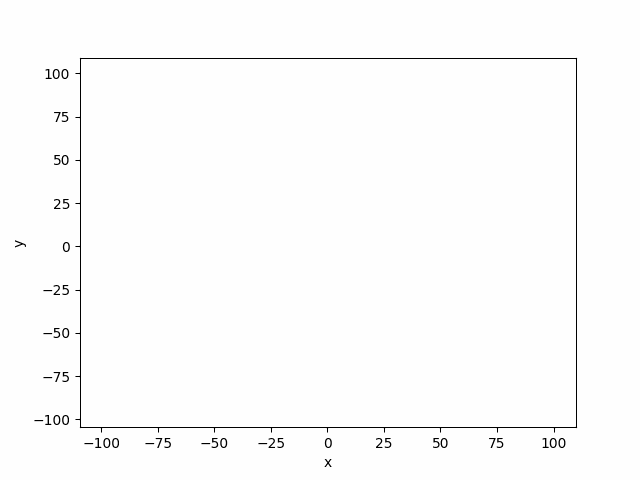

In [224]:
vis_graham_a.show_gif(interval=200)

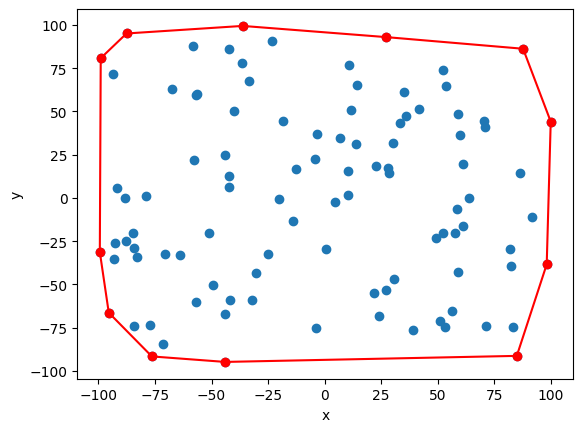

In [225]:
# visualize(graham_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point(graham_points_a, color = "red")
vis.add_line_segment([(graham_points_a[i], graham_points_a[i+1]) for i in range(len(graham_points_a)-1)], color = "red")
vis.add_line_segment([graham_points_a[-1], graham_points_a[0]], color = "red")
vis.show()

In [226]:
print("Liczba punktów otoczki: ", len(graham_points_a))
print("Punkty: ")
print(graham_points_a)

Liczba punktów otoczki:  12
Punkty: 
[(-44.00979183150877, -94.77621839319768), (84.95274212326959, -91.2817938457912), (98.17545111827616, -38.35917984979811), (99.95332941261935, 44.138832602546586), (87.72944837230267, 86.26756427506976), (27.090347936243745, 93.00889650269286), (-36.260219523705906, 99.46526864219547), (-87.59999083437826, 95.1021598631244), (-99.01130281231376, 80.81461325305227), (-99.41230841371672, -31.257986836186234), (-95.45587447444377, -66.31305869760703), (-76.40547971025634, -91.59751580330189)]


Zbiór danych B

In [227]:
graham_points_b, vis_graham_b = graham_algorithm_draw(points_b)

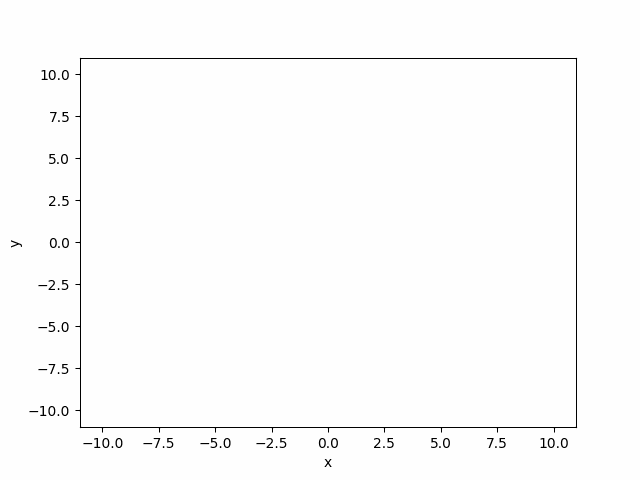

In [228]:
vis_graham_b.show_gif()

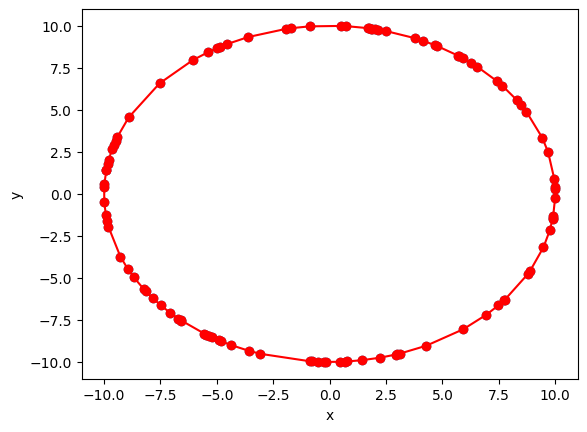

In [229]:
# visualize(graham_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point(graham_points_b, color = "red")
vis.add_line_segment([(graham_points_b[i], graham_points_b[i+1]) for i in range(len(graham_points_b)-1)], color ="red")
vis.add_line_segment([graham_points_b[-1], graham_points_b[0]], color ="red")
vis.show()

In [230]:
print("Liczba punktów otoczki: ", len(graham_points_b))
print("Punkty: ")
print(graham_points_b)

Liczba punktów otoczki:  100
Punkty: 
[(-0.17280571651609458, -9.998506797734318), (0.45232377828338655, -9.989764922139031), (0.6968418141643988, -9.975691027995609), (0.7589816831488119, -9.971155740667408), (1.4184366233559988, -9.89889072298116), (2.2276672957788874, -9.74871778334552), (2.9361240951867873, -9.559245540191107), (2.985803332983381, -9.54384505619959), (3.1210037005397417, -9.500491350515363), (4.282993606127313, -9.036369058967908), (5.924622811854615, -8.055981910186487), (6.947205014387926, -7.1927979596304015), (7.4781239792572185, -6.63910097459424), (7.7306615349576795, -6.343254072786757), (7.7770524719770915, -6.286291024770887), (8.785078247799001, -4.777279579431043), (8.894483870797826, -4.570356295970514), (9.482329595764892, -3.175755884396848), (9.759518478299041, -2.1798621680600765), (9.890592208842406, -1.4751900753414482), (9.897212863282899, -1.430097038269622), (9.910565256874438, -1.334427326321417), (9.997197414778455, -0.23673582311716457), (9.

Zbiór danych C

In [231]:
graham_points_c, vis_graham_c = graham_algorithm_draw(points_c)

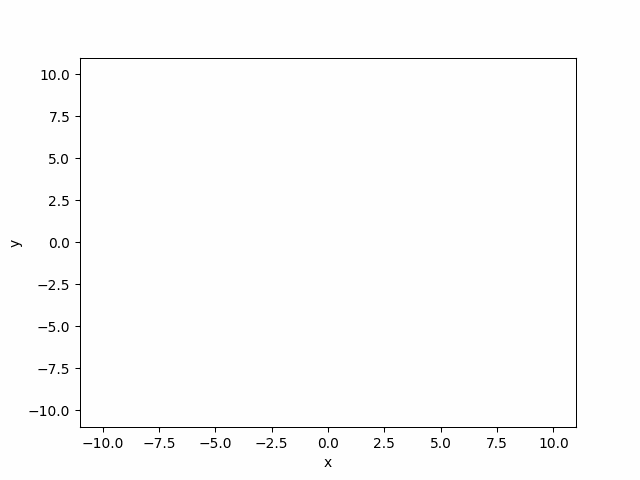

In [232]:
vis_graham_c.show_gif()

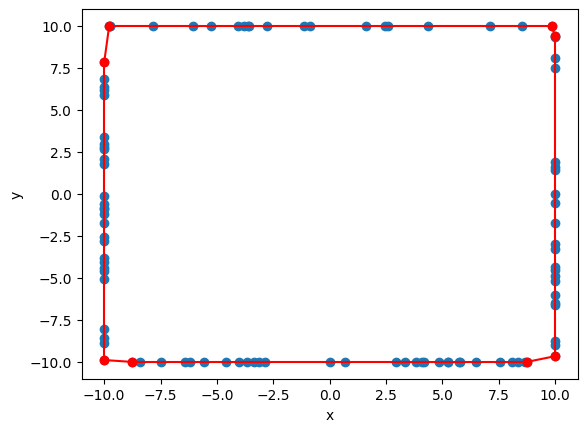

In [233]:
# visualize(graham_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point(graham_points_c, color = "red")
vis.add_line_segment([(graham_points_c[i], graham_points_c[i+1]) for i in range(len(graham_points_c)-1)], color ="red")
vis.add_line_segment([graham_points_c[-1], graham_points_c[0]], color = "red")
vis.show()

In [234]:
print("Liczba punktów otoczki: ", len(graham_points_c))
print("Punkty: ")
print(graham_points_c)

Liczba punktów otoczki:  8
Punkty: 
[(-8.753013293750573, -10.0), (8.743239601922717, -10.0), (10.0, -9.658052000549189), (10.0, 9.38054612302107), (9.847232601915234, 10.0), (-9.778657561727158, 10.0), (-10.0, 7.84279366647776), (-10.0, -9.887540871380207)]


Zbiór danych D

In [9]:
graham_points_d, vis_graham_d = graham_algorithm_draw(points_d)

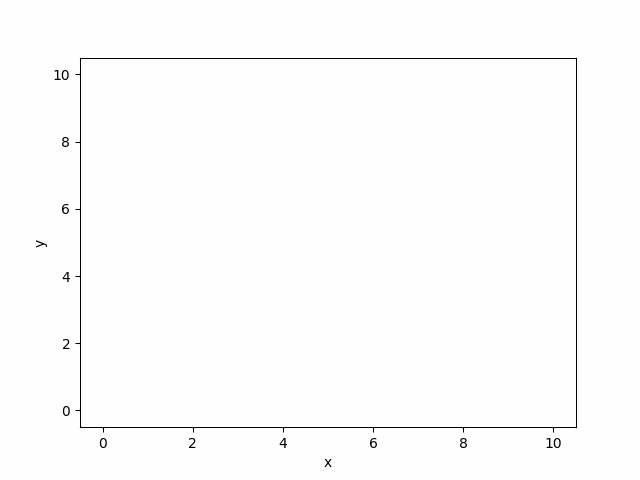

In [10]:
vis_graham_d.show_gif()

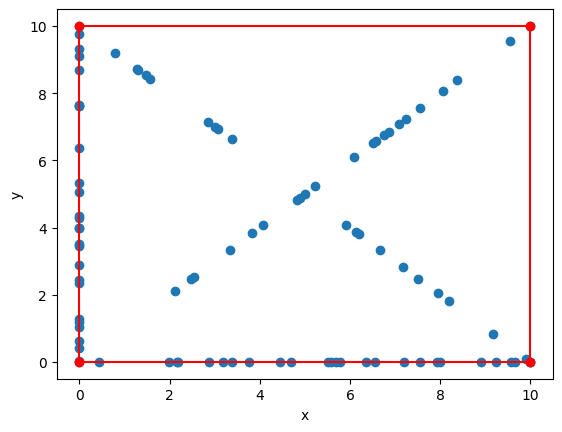

In [11]:
# visualize(graham_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point(graham_points_d, color = "red")
vis.add_line_segment([(graham_points_d[i], graham_points_d[i+1]) for i in range(len(graham_points_d)-1)], color = "red")
vis.add_line_segment([graham_points_d[-1], graham_points_d[0]], color = "red")
vis.show()

In [12]:
print("Liczba punktów otoczki: ", len(graham_points_d))
print("Punkty: ")
print(graham_points_d)

Liczba punktów otoczki:  4
Punkty: 
[(0, 0), (10, 0), (10, 10), (0, 10)]


### Algorytm Jarvisa

Algorytm Jarvisa oblicza otoczkę wypukłą dla zbioru punktów $Q$ przez technikę zwaną owijaniem paczki (*package wrapping*) lub owijaniem prezentu (*gift wrapping*). Algorytm Jarvisa buduje sekwencję $H = \langle p_1, p_2, \dots, p_m \rangle$ będącą wierzchołkami $\mathcal{CH}(Q)$. Zaczynamy od punktu $p_0$, następny punkt $p_1$ w otoczce wypukłej ma najmniejszy kąt w odniesieniu do $p_0$ (w przypadku takiego samego kąta - wybiera się punkt najdalej od $p_0$). Podobnie, gdy $p_2$ ma najmniejszy kąt w odniesieniu do $p_1$, itd.. Zauważyć warto, że możemy tym sposobem obliczyć lewy i prawy łańcuch otoczki wypukłej $\mathcal{CH}(Q)$. Lewy łańcuch buduje się podobnie. Gdy osiągniemy najwyższy wierzchołej w prawym łańcuchu $p_k$, wybieramy wierzchołek $p_{k+1}$, który ma najmniejszy kąt w odniesieniu do $p_k$, ale od ujemnej osi-$x$. Można zaimplementować algorytm Jarvisa bez konstruowania pomocniczych łańcuchów - lewego i prawego. Taka implementacja utrzymuje śledzenie kąta ostatniej strony otoczki wypukłej i wymaga sekwencji kątów boków otoczki tylko rosnącej. (Patrząc na trzy ostatnie punkty jesteśmy w stanie obliczyć jaki punkt należy włączyć do $\mathcal{CH}(Q)$ w zależności od budowanego punktu)

<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa.

Zamiast minimalizowania kąta można skorzystać z funkcji orient. Wystarczy znaleźć dowolny punkt na prawo od danego punktu i jeżeli on nie ma żadnego punktu po swojej prawej, to punkt można włączyć do otoczki. Jeżeli jednak jest punkt bardziej na prawo od niego, to bierzemy go zamiast poprzedniego.

In [13]:
def jarvis_algorithm(Q, eps = 1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa
    :parm Q: zbiór punktów
    :return: tablica punktów w postaci krotek współrzędnych
    '''
    n = len(Q)
        
    p0_i = find_p0_with_min_y(Q, n)
    p0 = Q[p0_i]

    # w przypadku gdy punktów jest za mało to trzeba zwrócić posortowaną listę punktów jako punkty otoczki
    if n < 3:
        return sorted(Q, key = cmp_to_key(lambda p1, p2: cmp(p0, p1, p2, eps)))

    S = [] # punkty otoczki
    p = p0

    while True:
        S.append(p)
        p_next = None
        max_dist = 0

        # sprawdzenie czy istnieje jakikolwiek punkt na prawo i jeżeli tak to zostaje on kandydatem na punkt otoczki
        for p_can in Q:
            if p_can == p: continue

            if p_next is None:
                p_next = p_can
                max_dist = partial_dist(p, p_next)
            else:
                o = orient(p, p_next, p_can)
                if o < -eps:
                    p_next = p_can
                    max_dist = partial_dist(p, p_next)
                elif abs(o) <= eps:
                    p_can_dist = partial_dist(p, p_can)
                    if p_can_dist > max_dist:
                        max_dist = p_can_dist
                        p_next = p_can

        p = p_next # przechodzimy dalej - p_next został uznany za punkt otoczki
        if p == p0 : break

    return S

Przetestuj swoją implementacje algorytmu Jarvisa, by sprawdzić czy poprawnie obliczana jest otoczka.

In [240]:
Test().runtest(2, jarvis_algorithm)

Lab 2, task 2:
	Test 1: Passed
	Test 2: Passed
	Test 3: Passed
	Test 4: Passed
	Test 5: Passed
	Test 6: Passed
	Test 7: Passed
	Test 8: Passed
	Test 9: Passed
	Test 10: Passed
	Test 11: Passed
Result: 11/11
Time: 2.966s


<span style="color:red">Ćw.</span> Uzupełnij funkcję ```jarvis_algorithm_draw```, która oblicza otoczkę wypukłą korzystając z algorytmu Jarvisa z dodatkową opcją wyświetlania kroków algorytmu.

In [14]:
def jarvis_algorithm_draw(Q, eps = 1e-24):
    '''
    Funkcja buduje otoczkę wypukłą dla podanego
    zbioru punktów Q algorymem Jarvisa oraz 
    pokazuje poszczególne kroki algorymu
    :parm Q: zbiór punktów
    :return: krotka w postaci  (tablica punktów w postaci krotek współrzędnych, wizualizer pokazujący kroki algorytmu) 
    '''
    
    n = len(Q)
    
    p0_i = find_p0_with_min_y(Q, n)
    p0 = Q[p0_i]

    vis = Visualizer()
    vis.add_point(Q)

    # w przypadku gdy punktów jest za mało to trzeba zwrócić posortowaną listę punktów jako punkty otoczki
    if n < 3:
        A = sorted(Q, key = cmp_to_key(lambda p1, p2: cmp(p0, p1, p2, eps)))
        for i in range(n - 1):
            vis.add_point(A[i], color ="red")
            vis.add_line_segment([A[i], A[i + 1]], color="red")
        vis.add_point(A[n - 1], color = "red")
        return A, vis

    S = [] # punkty otoczki
    p = p0
    vis.add_point(p0, color = "red")

    while True:
        S.append(p)
        p_next = None
        max_dist = 0

        # sprawdzenie czy istnieje jakikolwiek punkt na prawo i jeżeli tak to zostaje on kandydatem na punkt otoczki
        for p_can in Q:
            if p_can == p: continue

            if p_next is None:
                p_next = p_can
                max_dist = partial_dist(p, p_next)
                po = vis.add_point(p_next, color = "orange")
                ls = vis.add_line_segment([S[-1], p_next], color="orange")
            else:
                o = orient(p, p_next, p_can)
                if o < -eps:
                    p_next = p_can
                    max_dist = partial_dist(p, p_next)
                    vis.remove_figure(ls)
                    vis.remove_figure(po)
                    po = vis.add_point(p_next, color = "orange")
                    ls = vis.add_line_segment([S[-1], p_next], color="orange")
                elif abs(o) <= eps:
                    p_can_dist = partial_dist(p, p_can)
                    if p_can_dist > max_dist:
                        max_dist = p_can_dist
                        p_next = p_can
                        vis.remove_figure(ls)
                        vis.remove_figure(po)
                        po = vis.add_point(p_next, color = "orange")
                        ls = vis.add_line_segment([S[-1], p_next], color="orange")
        
        vis.add_point(p_next, color = "red")
        vis.add_line_segment([S[-1], p_next], color="red")

        p = p_next # przechodzimy dalej - p_next został uznany za punkt otoczki
        if p == p0 : break

    return S, vis

# Zwizualizuj swoją implementację algorytmu.

W przypadku algorytmu Jarvisa kolory na wizualizacjach są następujące:
- niebieskie - punkty, które nie weszły w skład otoczki
- żółte - punkty i krawędzie rozpatrywane w danym momencie przez algorytm
- czerwone - punkty i krawędzie, które weszły w skład otoczki

Zbiór danych A

In [242]:
jarvis_points_a, vis_jarvis_a = jarvis_algorithm_draw(points_a)

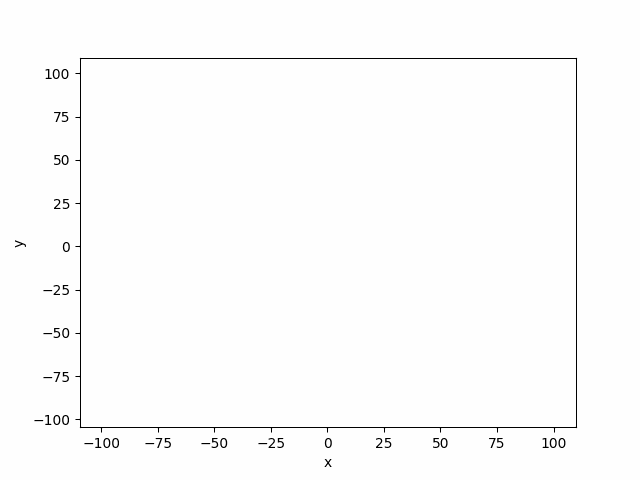

In [243]:
vis_jarvis_a.show_gif()

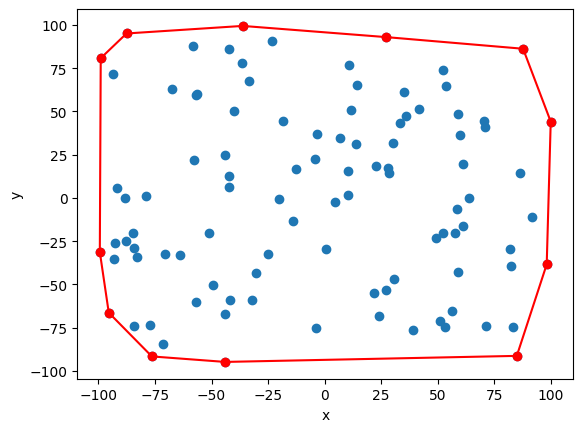

In [244]:
# visualize(jarvis_points_a)
vis.clear()
vis.add_point(points_a)
vis.add_point(jarvis_points_a, color = "red")
vis.add_line_segment([(jarvis_points_a[i], jarvis_points_a[i+1]) for i in range(len(jarvis_points_a)-1)], color = "red")
vis.add_line_segment([jarvis_points_a[-1], jarvis_points_a[0]], color = "red")
vis.show()

In [245]:
print("Liczba punktów otoczki: ", len(jarvis_points_a))
print("Punkty: ")
print(jarvis_points_a)

Liczba punktów otoczki:  12
Punkty: 
[(-44.00979183150877, -94.77621839319768), (84.95274212326959, -91.2817938457912), (98.17545111827616, -38.35917984979811), (99.95332941261935, 44.138832602546586), (87.72944837230267, 86.26756427506976), (27.090347936243745, 93.00889650269286), (-36.260219523705906, 99.46526864219547), (-87.59999083437826, 95.1021598631244), (-99.01130281231376, 80.81461325305227), (-99.41230841371672, -31.257986836186234), (-95.45587447444377, -66.31305869760703), (-76.40547971025634, -91.59751580330189)]


Zbiór danych B

In [246]:
jarvis_points_b, vis_jarvis_b = jarvis_algorithm_draw(points_b)

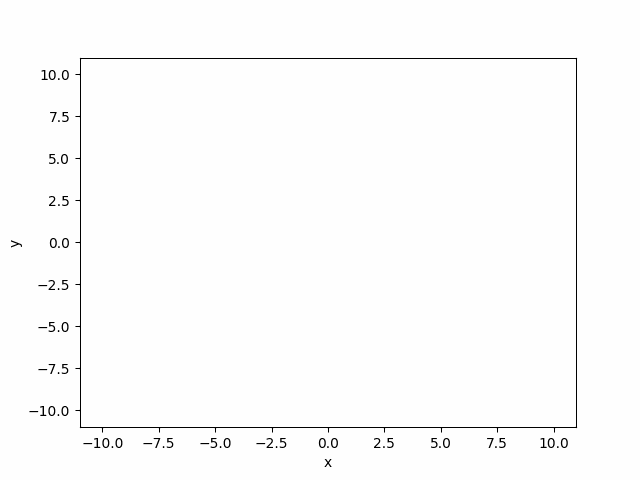

In [247]:
vis_jarvis_b.show_gif()

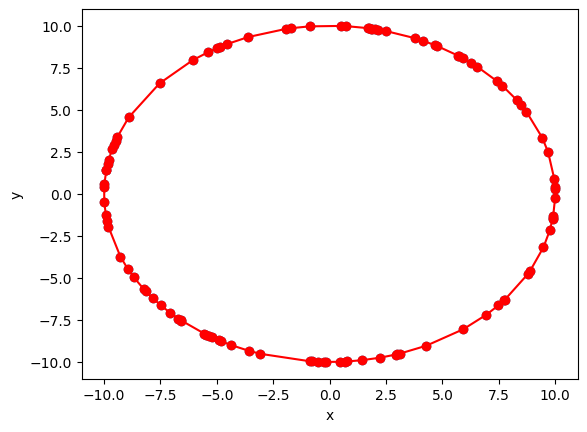

In [248]:
# visualize(jarvis_points_b)
vis.clear()
vis.add_point(points_b)
vis.add_point(jarvis_points_b, color = "red")
vis.add_line_segment([(jarvis_points_b[i], jarvis_points_b[i+1]) for i in range(len(jarvis_points_b)-1)], color = "red")
vis.add_line_segment([jarvis_points_b[-1], jarvis_points_b[0]], color = "red")
vis.show()

In [249]:
print("Liczba punktów otoczki: ", len(jarvis_points_b))
print("Punkty: ")
print(jarvis_points_b)

Liczba punktów otoczki:  100
Punkty: 
[(-0.17280571651609458, -9.998506797734318), (0.45232377828338655, -9.989764922139031), (0.6968418141643988, -9.975691027995609), (0.7589816831488119, -9.971155740667408), (1.4184366233559988, -9.89889072298116), (2.2276672957788874, -9.74871778334552), (2.9361240951867873, -9.559245540191107), (2.985803332983381, -9.54384505619959), (3.1210037005397417, -9.500491350515363), (4.282993606127313, -9.036369058967908), (5.924622811854615, -8.055981910186487), (6.947205014387926, -7.1927979596304015), (7.4781239792572185, -6.63910097459424), (7.7306615349576795, -6.343254072786757), (7.7770524719770915, -6.286291024770887), (8.785078247799001, -4.777279579431043), (8.894483870797826, -4.570356295970514), (9.482329595764892, -3.175755884396848), (9.759518478299041, -2.1798621680600765), (9.890592208842406, -1.4751900753414482), (9.897212863282899, -1.430097038269622), (9.910565256874438, -1.334427326321417), (9.997197414778455, -0.23673582311716457), (9.

Zbiór danych C

In [250]:
jarvis_points_c, vis_jarvis_c = jarvis_algorithm_draw(points_c)

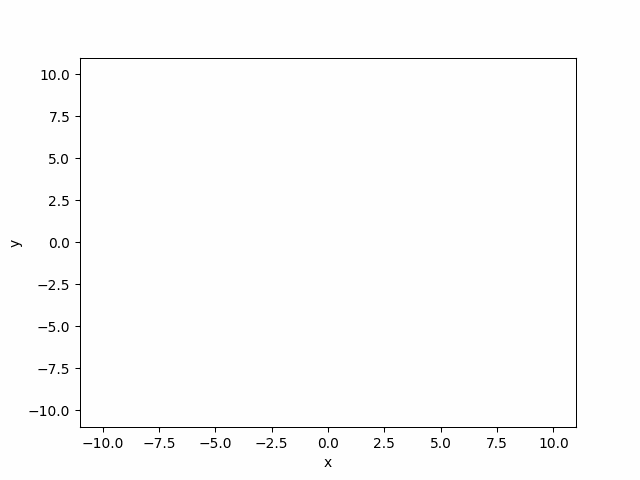

In [251]:
vis_jarvis_c.show_gif()

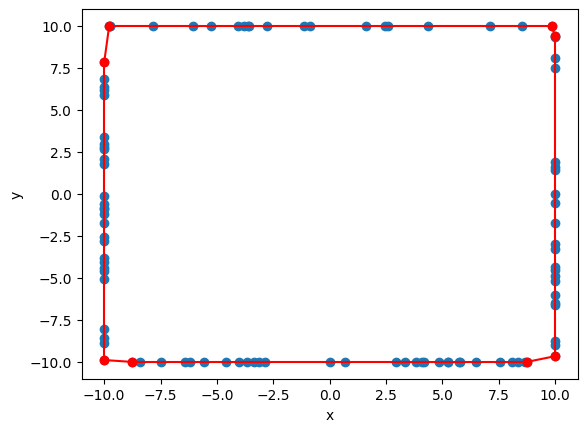

In [252]:
# visualize(jarvis_points_c)
vis.clear()
vis.add_point(points_c)
vis.add_point(jarvis_points_c, color = "red")
vis.add_line_segment([(jarvis_points_c[i], jarvis_points_c[i+1]) for i in range(len(jarvis_points_c)-1)], color = "red")
vis.add_line_segment([jarvis_points_c[-1], jarvis_points_c[0]], color = "red")
vis.show()

In [253]:
print("Liczba punktów otoczki: ", len(jarvis_points_c))
print("Punkty: ")
print(jarvis_points_c)

Liczba punktów otoczki:  8
Punkty: 
[(-8.753013293750573, -10.0), (8.743239601922717, -10.0), (10.0, -9.658052000549189), (10.0, 9.38054612302107), (9.847232601915234, 10.0), (-9.778657561727158, 10.0), (-10.0, 7.84279366647776), (-10.0, -9.887540871380207)]


Zbiór danych D

In [15]:
jarvis_points_d, vis_jarvis_d = jarvis_algorithm_draw(points_d)

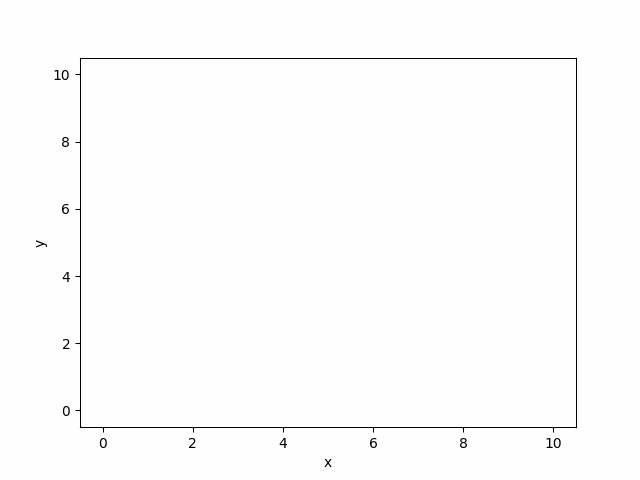

In [16]:
vis_jarvis_d.show_gif()

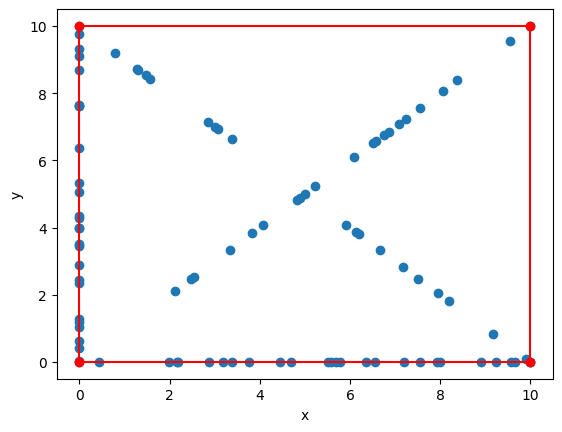

In [17]:
# visualize(jarvis_points_d)
vis.clear()
vis.add_point(points_d)
vis.add_point(jarvis_points_d, color = "red")
vis.add_line_segment([(jarvis_points_d[i], jarvis_points_d[i+1]) for i in range(len(jarvis_points_d)-1)], color = "red")
vis.add_line_segment([jarvis_points_d[-1], jarvis_points_d[0]], color = "red")
vis.show()

In [18]:
print("Liczba punktów otoczki: ", len(jarvis_points_d))
print("Punkty: ")
print(jarvis_points_d)

Liczba punktów otoczki:  4
Punkty: 
[(0, 0), (10, 0), (10, 10), (0, 10)]



---

Po zobaczeniu i przetestowaniu wstępnie zbiorów danych, przyszła kolej na porównanie czasów działania dla różnych danych. Do tego potrzebujemy bardziej miarodajnych zbiorów danych.  
<span style="color:red">Ćw.</span> Stwórz zmodyfikowane zbiory danych A, B, C oraz D - tak jak uważasz za słuszne.

In [23]:
no_points_acd=[1000,2500,5000,10000,25000,50000,60000,70000,85000,100000]
no_points_b=[100,500,1000,2000,3000,5000,7000,8000,10000,12000]

a_points_set = [generate_uniform_points(-1000, 1000, i) for i in no_points_acd]
b_points_set = [generate_circle_points((200, 200), 2500, i) for i in no_points_b]
c_points_set = [generate_rectangle_points((-300, 100), (100, 100), (100, 500), (-300, 500), i) for i in no_points_acd]
d_points_set = [generate_square_points((0, 0), (300, 0), (300, 300), (0, 300), int(0.3 * i) - 1, int(0.2 * i) - 1) for i in no_points_acd]

Po przygotowaniu zbioru danych, dokonaj porównania czasowego  
<span style="color:red">Ćw.</span> Porównaj zmodyfikowane zbiory danych A, B, C oraz D dla algorytmów Grahama i Jarvisa.

Wyniki testów zapisywane będą jako CSV w formacie: A.csv; a w nim
Liczba punktów; Liczba punktów otoczki; Czas dla algorytmu Grahama; Czas dla algorytmu Jarvisa

In [24]:
from time import time

In [260]:
A_results_df = pd.DataFrame(columns=['PointsNo', 'Hull', 'GrahamTime', 'JarvisTime'])

for i in range(len(no_points_acd)):
    t0 = time()
    graham_hull = graham_algorithm(a_points_set[i], 1e-24)
    graham_time = time() - t0
    t0 = time()
    jarvis_hull = jarvis_algorithm(a_points_set[i], 1e-24)
    jarvis_time = time() - t0

    if len(graham_hull) != len(jarvis_hull):
        raise Exception("Niezgodna liczba punktów otoczki między algorytmami")

    A_results_df.loc[i] = {
        'PointsNo': no_points_acd[i],
        'Hull': len(graham_hull),
        'GrahamTime': graham_time,
        'JarvisTime': jarvis_time,
    }

A_results_df.to_csv('A.csv', index = False)

In [264]:
print(A_results_df)

   PointsNo  Hull  GrahamTime  JarvisTime
0      1000    21    0.010173    0.016104
1      2500    21    0.026314    0.041628
2      5000    21    0.059214    0.085604
3     10000    24    0.128647    0.186446
4     25000    26    0.349232    0.579242
5     50000    33    0.746021    1.300719
6     60000    28    0.906615    1.314946
7     70000    29    1.055478    1.589384
8     85000    38    1.327894    2.590327
9    100000    34    1.604873    2.715007


In [261]:
B_results_df = pd.DataFrame(columns=['PointsNo', 'Hull', 'GrahamTime', 'JarvisTime'])

for i in range(len(no_points_b)):
    t0 = time()
    graham_hull = graham_algorithm(b_points_set[i], 1e-24)
    graham_time = time() - t0
    t0 = time()
    jarvis_hull = jarvis_algorithm(b_points_set[i], 1e-24)
    jarvis_time = time() - t0

    if len(graham_hull) != len(jarvis_hull):
        raise Exception("Niezgodna liczba punktów otoczki między algorytmami")

    B_results_df.loc[i] = {
        'PointsNo': no_points_b[i],
        'Hull': len(graham_hull),
        'GrahamTime': graham_time,
        'JarvisTime': jarvis_time,
    }

B_results_df.to_csv('B.csv', index = False)

In [265]:
print(B_results_df)

   PointsNo   Hull  GrahamTime  JarvisTime
0       100    100    0.000489    0.007627
1       500    500    0.003850    0.207682
2      1000   1000    0.008647    0.778803
3      2000   2000    0.018933    3.056279
4      3000   3000    0.029456    6.769918
5      5000   5000    0.052857   19.661115
6      7000   7000    0.073774   36.574789
7      8000   8000    0.087359   49.682534
8     10000  10000    0.112609   77.219204
9     12000  12000    0.137825  109.878763


In [262]:
C_results_df = pd.DataFrame(columns=['PointsNo', 'Hull', 'GrahamTime', 'JarvisTime'])

for i in range(len(no_points_acd)):
    t0 = time()
    graham_hull = graham_algorithm(c_points_set[i], 1e-24)
    graham_time = time() - t0
    t0 = time()
    jarvis_hull = jarvis_algorithm(c_points_set[i], 1e-24)
    jarvis_time = time() - t0

    if len(graham_hull) != len(jarvis_hull):
        raise Exception("Niezgodna liczba punktów otoczki między algorytmami")

    C_results_df.loc[i] = {
        'PointsNo': no_points_acd[i],
        'Hull': len(graham_hull),
        'GrahamTime': graham_time,
        'JarvisTime': jarvis_time,
    }

C_results_df.to_csv('C.csv', index = False)

In [266]:
print(C_results_df)

   PointsNo  Hull  GrahamTime  JarvisTime
0      1000     8    0.006256    0.003984
1      2500     8    0.021822    0.011726
2      5000     8    0.044466    0.020553
3     10000     8    0.092129    0.041723
4     25000     8    0.252898    0.103589
5     50000     8    0.653552    0.260276
6     60000     8    0.725116    0.248616
7     70000     8    0.828082    0.289644
8     85000     8    1.037532    0.350581
9    100000     8    1.295253    0.409876


In [25]:
D_results_df = pd.DataFrame(columns=['PointsNo', 'Hull', 'GrahamTime', 'JarvisTime'])

for i in range(len(no_points_acd)):
    t0 = time()
    graham_hull = graham_algorithm(d_points_set[i], 1e-24)
    graham_time = time() - t0
    t0 = time()
    jarvis_hull = jarvis_algorithm(d_points_set[i], 1e-24)
    jarvis_time = time() - t0

    if len(graham_hull) != len(jarvis_hull):
        raise Exception("Niezgodna liczba punktów otoczki między algorytmami")

    D_results_df.loc[i] = {
        'PointsNo': no_points_acd[i],
        'Hull': len(graham_hull),
        'GrahamTime': graham_time,
        'JarvisTime': jarvis_time,
    }

D_results_df.to_csv('D.csv', index = False)

In [26]:
print(D_results_df)

   PointsNo  Hull  GrahamTime  JarvisTime
0      1000     4    0.013689    0.003581
1      2500     4    0.028203    0.006552
2      5000     4    0.065970    0.013139
3     10000     4    0.130318    0.024008
4     25000     4    0.353073    0.060776
5     50000     4    0.898630    0.126841
6     60000     4    0.986054    0.151621
7     70000     4    1.173636    0.178094
8     85000     4    1.466060    0.218843
9    100000     4    1.727757    0.252069


WNIOSKI HERE  
W sprawozdaniu napisz, czy Twój program działał poprawnie dla wszystkich zbiorów
danych oraz opisz krótko wnioski dotyczące działania algorytmu dla poszczególnych
zbiorów. Napisz, dlaczego wg Ciebie zaproponowano takie zbiory punktów? Które ze
zbiorów mogły stwarzać problemy w działaniu algorytmów? Jeśli tak, to jakie i
dlaczego? Porównaj czasy działania obu algorytmów w zależności od liczby punktów
w poszczególnych zbiorach (A, B, C, D). Dołącz wybrane, istotne ilustracje.

Bibliografia:
- Wprowadzenie do algorytmów wydanie 3, Thomas H. Cormen, Charles E. Leiserson, Ronald L. Rivest, Stein Clifford
